In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [5]:
data = pd.read_csv('Demographic_Data.csv')

In [6]:
data.head()

,in-store,age,items,amount,region
0,0,37,4,281.03,2
1,0,35,2,219.51,2
2,1,45,3,1525.70,4
3,1,46,3,715.25,3
4,1,33,4,1937.50,1


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80000 entries, 0 to 79999
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   in-store  80000 non-null  int64  
 1   age       80000 non-null  int64  
 2   items     80000 non-null  int64  
 3   amount    80000 non-null  float64
 4   region    80000 non-null  int64  
dtypes: float64(1), int64(4)
memory usage: 3.1 MB


In [8]:
data = data.drop_duplicates()
print(data.isnull().sum())

in-store    0
age         0
items       0
amount      0
region      0
dtype: int64


In [9]:
data.describe()

,in-store,age,items,amount,region
count,79979.000000,79979.000000,79979.000000,79979.000000,79979.000000
mean,0.500006,45.758512,4.505133,835.825727,2.674915
std,0.500003,15.715158,2.061250,721.263650,1.126642
min,0.000000,18.000000,1.000000,5.004700,1.000000
25%,0.000000,33.000000,3.000000,285.120000,2.000000
50%,1.000000,45.000000,4.000000,582.140000,3.000000
75%,1.000000,56.000000,6.000000,1233.400000,4.000000
max,1.000000,85.000000,8.000000,3000.000000,4.000000


In [10]:
header = data.dtypes.index
print(header)

Index(['in-store', 'age', 'items', 'amount', 'region'], dtype='object')


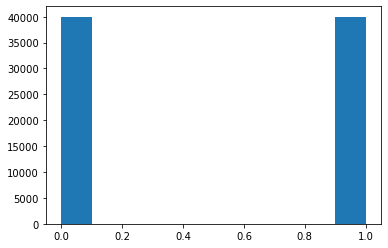

In [11]:
plt.hist(data['in-store'])
plt.show()

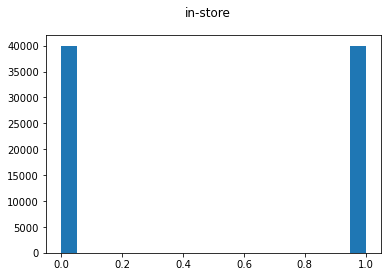

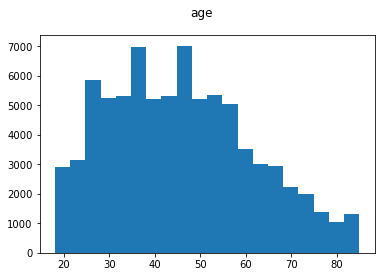

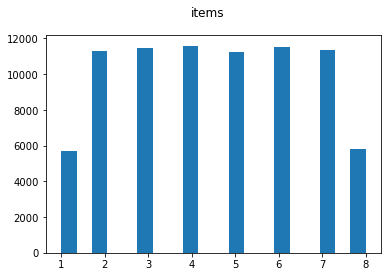

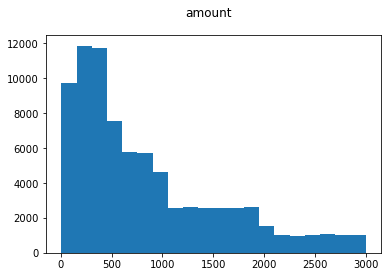

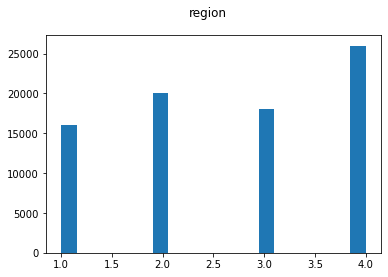

In [12]:
for column in header.values:
    plt.suptitle(column)
    plt.hist(data[column], bins=20)
    plt.show()

In [14]:
# Data for plotting
def vsCombinations(data, func):
    header = data.dtypes.index
    for column1 in range(len(header.values)):
        x_axis = header.values[column1]
        x = data[x_axis]
        for column2 in range(column1,len(header.values)):
            if column1 != column2:
                y_axis = header.values[column2]
                y = data[y_axis]
                func(x, y, x_axis, y_axis)

def linePlot(x, y, x_axis, y_axis):
    fig, ax = plt.subplots()
    ax.plot(x, y)
    plt.suptitle(x_axis + " vs. " + y_axis)
    plt.xlabel(x_axis)
    plt.ylabel(y_axis)
    plt.show()

In [15]:
data_sample = data.sample(1000)

def scatterPlot(x, y, x_axis, y_axis):
    plt.scatter(x,y, marker='o')
    plt.suptitle(x_axis + " vs. " + y_axis)
    plt.xlabel(x_axis)
    plt.ylabel(y_axis)
    plt.show()

# vsCombinations(data_sample, scatterPlot)
    


In [17]:
corr_mat = data.corr()
print(corr_mat)

          in-store       age     items    amount    region
in-store  1.000000 -0.178180 -0.003897 -0.085573 -0.133171
age      -0.178180  1.000000  0.000657 -0.282033 -0.235370
items    -0.003897  0.000657  1.000000  0.000384 -0.001904
amount   -0.085573 -0.282033  0.000384  1.000000  0.403486
region   -0.133171 -0.235370 -0.001904  0.403486  1.000000


In [18]:
cov_mat = data.cov()
print(cov_mat)

           in-store          age     items         amount      region
in-store   0.250003    -1.400071 -0.004017     -30.860425   -0.075019
age       -1.400071   246.966189  0.021270   -3196.782841   -4.167305
items     -0.004017     0.021270  4.248751       0.570791   -0.004421
amount   -30.860425 -3196.782841  0.570791  520221.252295  327.874873
region    -0.075019    -4.167305 -0.004421     327.874873    1.269321


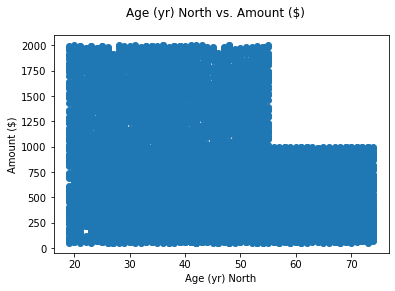

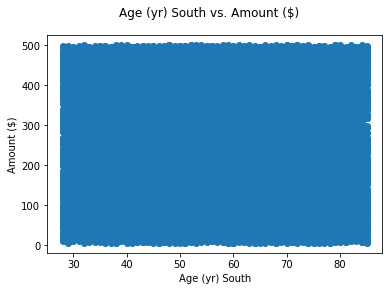

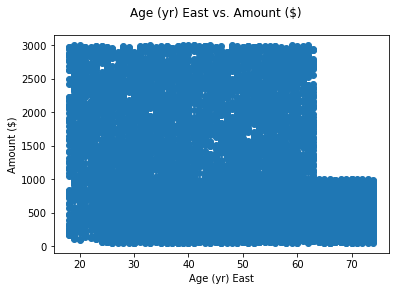

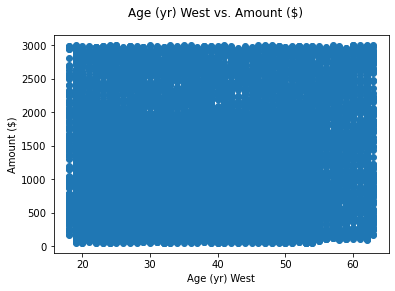

In [19]:
regions = { 1: "North", 2: "South", 3: "East", 4: "West"}
groupByRegion = data.groupby(by="region")

for region in groupByRegion:
    regionData = region[1]
    scatterPlot(regionData['age'], regionData['amount'], 'Age (yr) ' + regions[region[0]], 'Amount ($)')

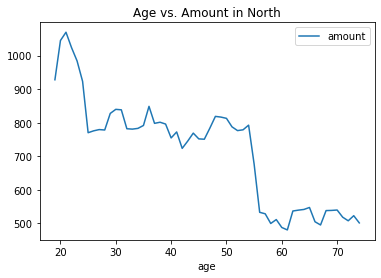

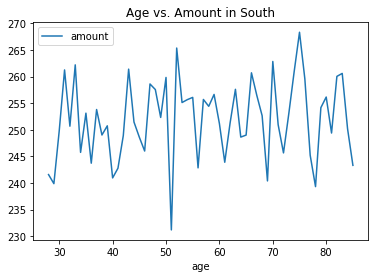

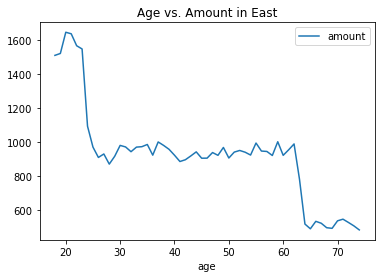

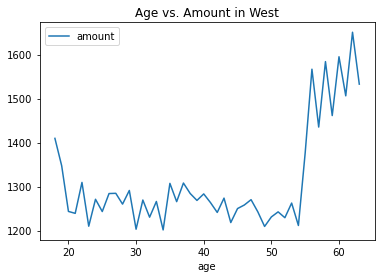

In [20]:
byAge = data.groupby(by="age").mean()

for region in groupByRegion:
    regionData = region[1]
    byAge = regionData.groupby(by="age").mean()
    byAge.plot.line(y='amount', title="Age vs. Amount in " + regions[region[0]])

,in-store,age,items,amount
region,,,,
1,1.000000,43.704132,4.510283,744.990939
2,0.000000,56.609083,4.512804,252.097741
3,0.611056,45.646944,4.494000,917.969637
4,0.500000,38.752424,4.503771,1283.938357


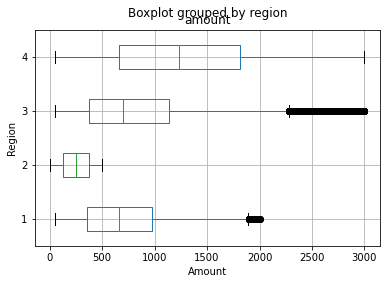

In [47]:
amountItemsBoxplot = data.boxplot(column='amount',by='region', vert=False)
amountItemsBoxplot.set_xlabel('Amount')
amountItemsBoxplot.set_ylabel('Region')
groupByRegion.mean()

<AxesSubplot:xlabel='items'>

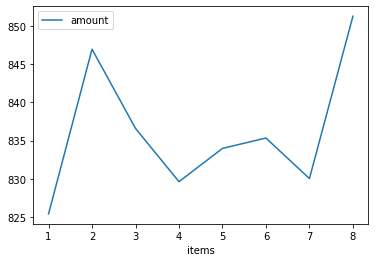

In [42]:
byItems = data.groupby('items')
byItems.mean().plot.line(y='amount')

Text(0, 0.5, 'Items')

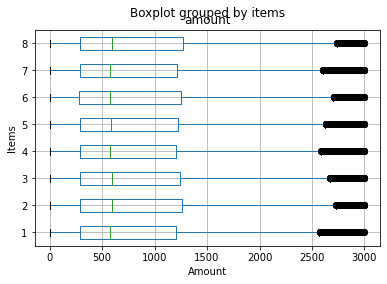

In [39]:
amountItemsBoxplot = data.boxplot(column='amount',by='items', vert=False)
amountItemsBoxplot.set_xlabel('Amount')
amountItemsBoxplot.set_ylabel('Items')